In [74]:
include("settings.jl")

  Activating project at `~/Documents/Github/LocomotionControl`


# Compare kinematics

Compare movement kinematics for baseline, CUN and MOs recordings.

## Bouts data
Look at bouts only

In [2]:
baseline = convert(DataFrame, py"get_bouts('outbound', baseline=True)");
mos = convert(DataFrame, py"get_bouts('outbound', baseline=False, target='MOs')");
MRN = convert(DataFrame, py"get_bouts('outbound', baseline=False, target='CUN/GRN')");

println(size(baseline), size(mos), size(MRN))

(1075, 22)(220, 25)(54, 25)


In [3]:
_, X_bl, Y_bl, S_bl, A_bl, T_bl, D_bl = stack_kinematic_variables(baseline)
_, X_mos, Y_mos, S_mos, A_mos, T_mos, D_mos = stack_kinematic_variables(mos)
_, X_mrn, Y_mrn, S_mrn, A_mrn, T_mrn, D_mrn = stack_kinematic_variables(MRN);

baseline


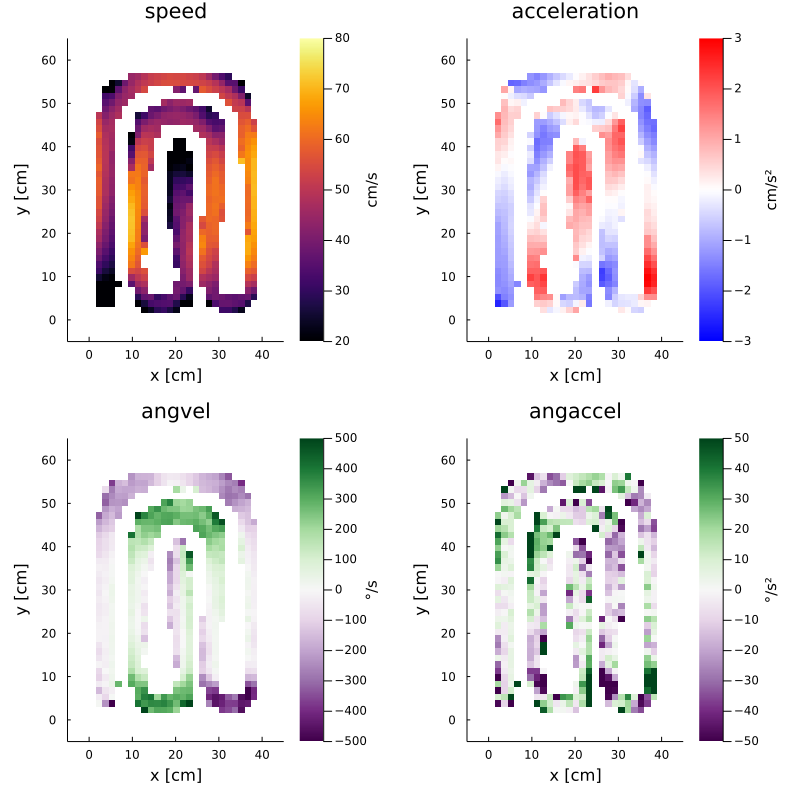

In [4]:
println("baseline")
kinematics_heatmaps(X_bl, Y_bl, S_bl, A_bl, T_bl, D_bl; stepsize=1.5)

MOs


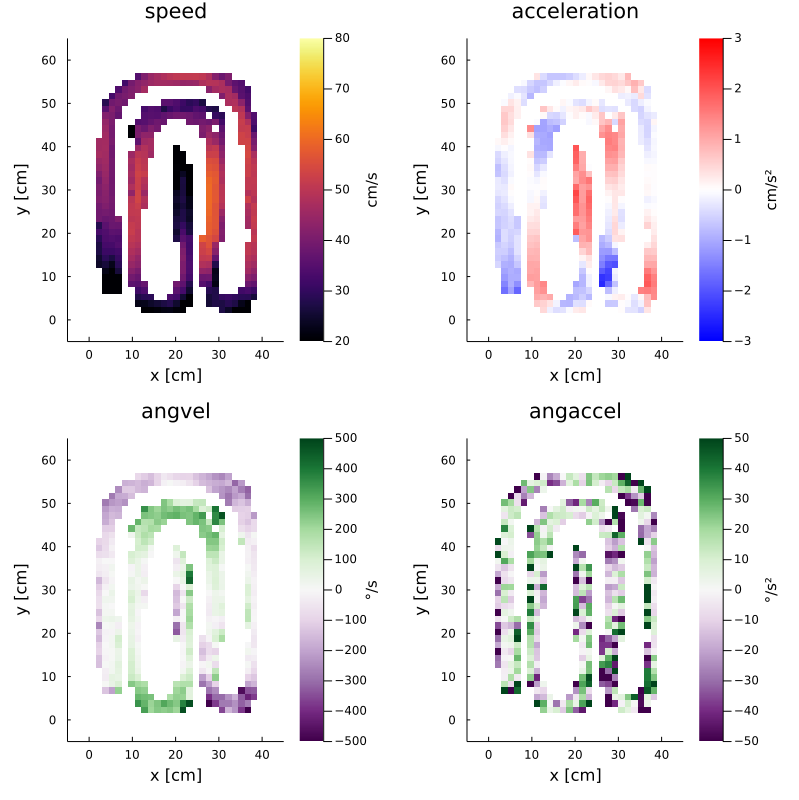

In [5]:
println("MOs")
kinematics_heatmaps(X_mos, Y_mos, S_mos, A_mos, T_mos, D_mos; stepsize=1.5)

CUN


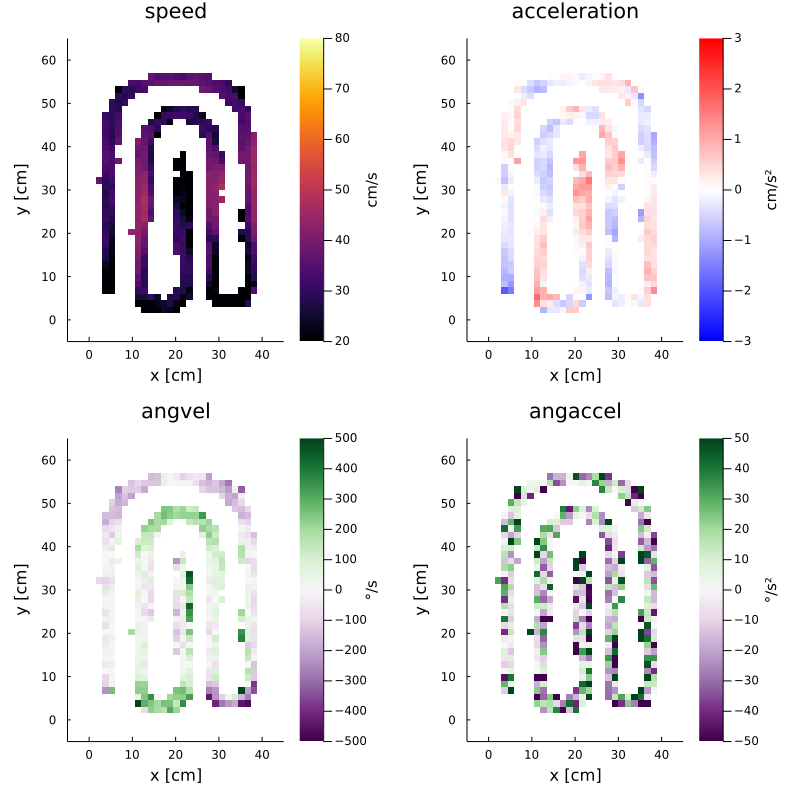

In [6]:
println("CUN")
kinematics_heatmaps(X_mrn, Y_mrn, S_mrn, A_mrn, T_mrn, D_mrn; stepsize=1.5)

Plot KDE visualization of variables values

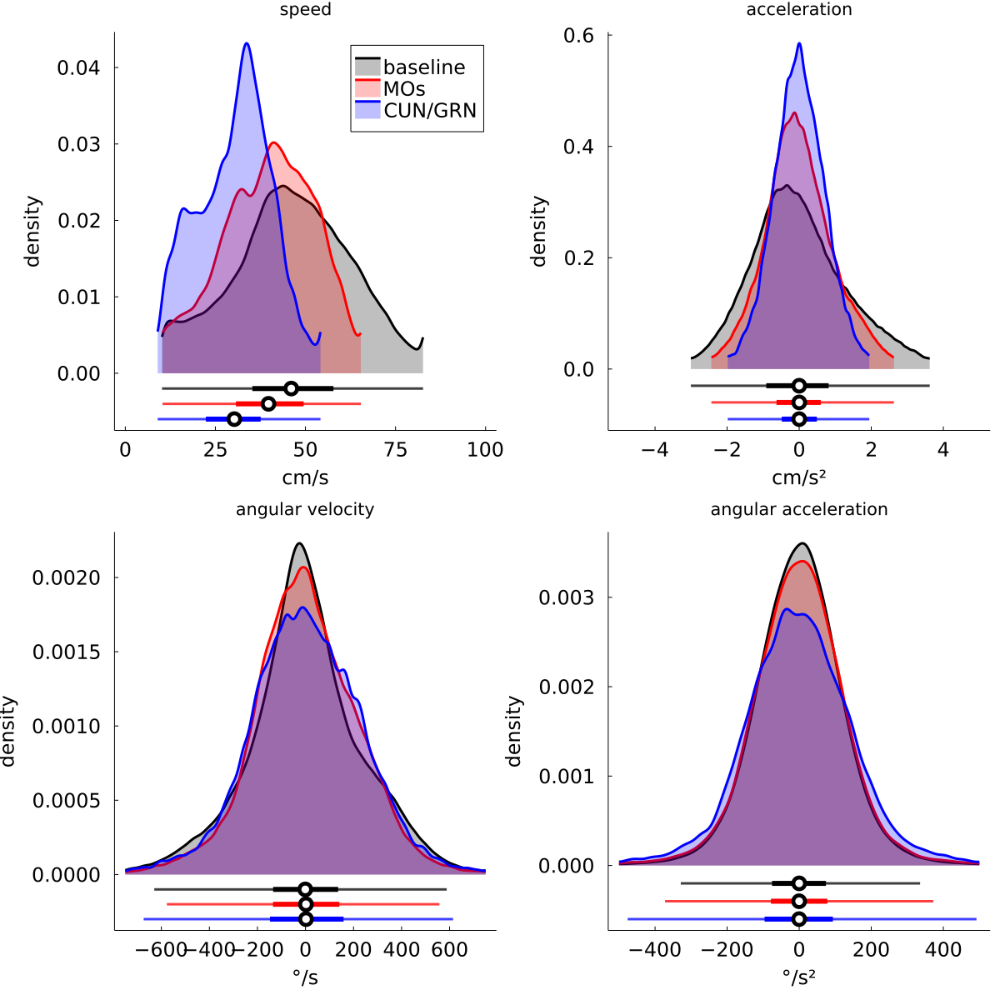

In [7]:
speed_plot = plot(title="speed",  ylabel="density", xlabel="cm/s", grid=false, xlim=[0, 100])
accel_plot = plot(title="acceleration",  ylabel="density", xlabel="cm/s²", grid=false, xlim=[-5, 5])
angvel_plot = plot(title="angular velocity",  ylabel="density", xlabel="°/s", grid=false,)
angaccel_plot = plot(title="angular acceleration",  ylabel="density", xlabel="°/s²", grid=false,)

colors = (:black, :red, :blue)
blvars = (S_bl, A_bl, T_bl, D_bl)
mosvars = (S_mos, A_mos, T_mos, D_mos)
mrnvars = (S_mrn, A_mrn, T_mrn, D_mrn)


for (i, (color, (S, A, T, D), lbl)) in enumerate(zip(colors, (blvars, mosvars, mrnvars), ("baseline", "MOs", "CUN/GRN")))
    plot_density!(speed_plot, S, color=color, label=lbl, bandwidth=1, y=-0.002 * i)
    plot_density!(accel_plot, A, color=color, label=nothing, bandwidth=.05, y = -0.03 * i)
    plot_density!(angvel_plot, T, color=color, label=nothing, boundary=(-750, 750), bandwidth=15, y = -0.0001 * i)
    plot_density!(angaccel_plot, D, color=color, label=nothing, boundary=(-500, 500), bandwidth=15, y = -0.0002 * i)
end

plot(speed_plot, accel_plot, angvel_plot, angaccel_plot, layout=(2, 2), size=(1200, 1200); axes_fontsize...)

## Whole Session Tracking data
Make the same KDE plot as above but with whole session tracking data


In [19]:
function get_whole_session_tracking(target::String, condition::String)::Vector{DataFrame}
    dest_folder = "/Users/federicoclaudi/Desktop/mysql-server-locomotion/whole_session_tracking"

    csv_files = filter(fl -> endswith(fl, ".csv"), readdir(dest_folder))

    csv_files = filter(fl -> occursin(target, fl), csv_files)
    csv_files = filter(fl -> occursin(condition, fl), csv_files)

    data = map(csv_files) do fl
        CSV.read(joinpath(dest_folder, fl), DataFrame, header=1)
    end

    return data
end


cun_naive = get_whole_session_tracking("CUN-GRN", "naive")
cun_implanted = get_whole_session_tracking("CUN-GRN", "implanted")
mos_naive = get_whole_session_tracking("MOs", "naive")
mos_implanted = get_whole_session_tracking("MOs", "implanted");

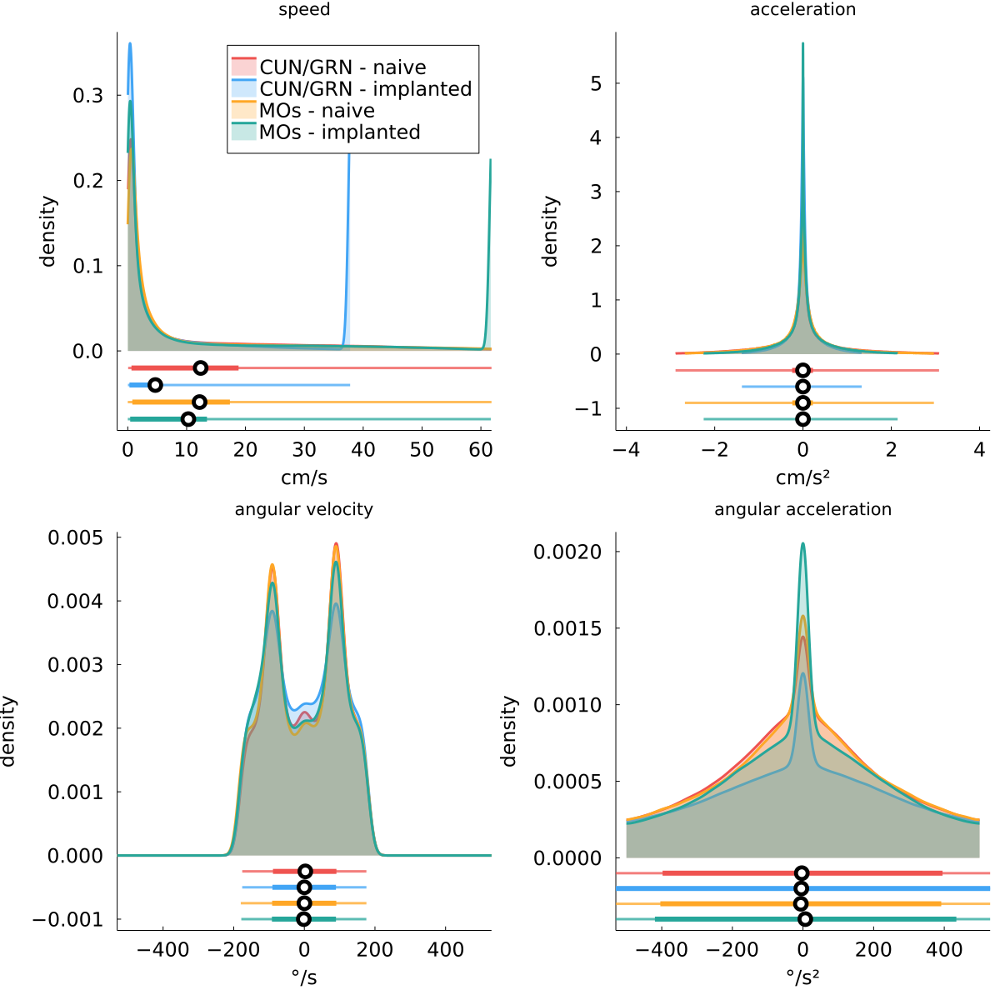

In [85]:
speed_plot = plot(title="speed",  ylabel="density", xlabel="cm/s", grid=false, xlim=[0, 60])
accel_plot = plot(title="acceleration",  ylabel="density", xlabel="cm/s²", grid=false, xlim=[-4, 4])
angvel_plot = plot(title="angular velocity",  ylabel="density", xlabel="°/s", grid=false, xlim=[-500, 500])
angaccel_plot = plot(title="angular acceleration",  ylabel="density", xlabel="°/s²", grid=false, xlim=[-750, 750])


colors = Dict(
    "CUN/GRN" => Dict(
        "naive" => MyterialColors.red,
        "implanted" => MyterialColors.blue
    ),
    "MOs" => Dict(
        "naive" => orange,
        "implanted" => teal
    )

)

k = 0
for (tgt, (naive_data, implanted_data)) in zip(("CUN/GRN", "MOs"), ((cun_naive, cun_implanted), (mos_naive, mos_implanted)))
    for (condition, _data) in zip(("naive", "implanted"), (naive_data, implanted_data))
        X, Y, S, A, T, D = stack_kinematic_variables(_data)
        lbl = "$(tgt) - $(condition)"
        color = colors[tgt][condition]

        k += 1
        plot_density!(speed_plot, S, color=color, label=lbl, bandwidth=.5, y=-0.02 * k)
        plot_density!(accel_plot, A, color=color, label=nothing, bandwidth=.005, y = -0.3 * k)
        plot_density!(angvel_plot, T .- 180, color=color, label=nothing, boundary=(-750, 750), bandwidth=15, y = -0.00025 * k)
        plot_density!(angaccel_plot, D, color=color, label=nothing, boundary=(-500, 500), bandwidth=15, y = -0.0001 * k)

    end

end


plot(speed_plot, accel_plot, angvel_plot, angaccel_plot, layout=(2, 2), size=(1200, 1200); axes_fontsize...)